# COMPUTATIONAL SOCIAL NETWORK ANALYSIS
## Moses Boudourides

# III. Elementary Motifs

<span style="color:green">
    
### [1. Cliques](#1)

### [2. Clustering](#2)

### [3. Triangles](#3)

### [4. Cycles](#4)

### [5. Ego-nets](#5)

</span>

In [1]:
# The modules (libraries) of Python which are used in this notebook:

import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import matplotlib.colors
from collections import Counter, defaultdict
import random, math
import numpy as np
import scipy as sp
import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
from networkx.drawing.nx_agraph import to_agraph
from pylab import hist
import itertools
from IPython.core.display import Image, display

<a id='1'></a>
## <span style="color:green">1. Cliques</span>

* **Clique** is a subset of nodes of an *undirected graph* such that every pair of nodes in the clique are adjacent. <u>Cliques are not defined for directed graphs (and cliques in weighted graphs correspond to the cliques of the underlying simple graph).</u> 


* A graph $G = (V,E)$ is **complete** if every pair of nodes in $V$ is adjacent (i.e., if $E = V \times V$, typically excluding diagonal elements). Notice that, if $G$ is complete undirected graph with $n$ nodes, the number of its edges are $|E| = n(n-1)/2$, while if it is complete directed graph with $n$ nodes, the number of its edges are $|E| = n(n-1)$.


* Thus, the induced subgraph of a clique is complete (as a graph).


* The **size** of a clique is the number of its nodes.


* Calling **k-clique** to be a clique of size $k$ (i.e., a clique including $k$ nodes). Then we have the foloowing simple cases:


- **1-clique** is a **point** (node)
- **2-clique** is an **edge** (link) or dyad (of nodes)
- **3-clique** is a **triplet** (**triangle**)
- **4-clique** is a **quatruple**
- **5-clique** is a **quintuple**


* **Maximal clique** is a clique such that there is no other clique containing it. <u>In our computations here, all cliques considered will be maximal.</u>


* The problem of finding *whether there is a clique of a given size in a graph* (the so called *clique problem*) is NP-complete.


*  **Maximum clique** of a graph is a clique having the maximum size. Moreover, the **clique number** $\omega(G)$ of a graph $G$ is the size of its maximum clique.

### A First Example

Number of cliques of the Example graph is 5
The clique number of the Example graph is 4
There are 1 cliques of size 4 (4-cliques)
There are 2 cliques of size 3 (3-cliques)
There are 1 cliques of size 2 (2-cliques)
There are 1 cliques of size 1 (1-cliques)
All the cliques are:
1. [1, 0, 2, 3]
2. [1, 6, 7]
3. [1, 5, 6]
4. [8, 6]
5. [9]


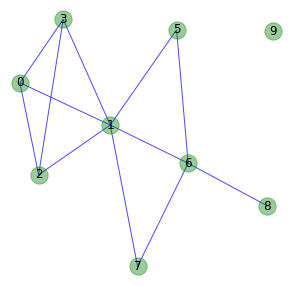

In [2]:
G=nx.complete_graph(4)
G.add_edges_from([(1,5),(5,6),(7,1),(7,6),(1,6),(6,8)])
G.add_node(9)
name="Example graph"

nc=nx.graph_number_of_cliques(G)
print("Number of cliques of the %s is %i" %(name,nc))
print("The clique number of the %s is %i" %(name,nx.graph_clique_number(G)))
cliques=list(nx.find_cliques(G))
cliques=sorted(cliques, key=lambda l: (len(l), l),reverse=True)
c_d={}
xs=range(1,nc+2)
for i in xs[::-1]:
    t=[]
    for c in cliques:
        if len(c)==i:
            t.append(c)
    if len(t)>0:
        c_d[i]=len(t)
for k,v in c_d.items():
    print("There are %i cliques of size %i (%i-cliques)" %(v,k,k))
print("All the cliques are:")
for i,c in enumerate(cliques):
    print("%i. %s" %((i+1),c))
    
pos=graphviz_layout(G)
plt.figure(figsize=(5,5));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');

### The Florentine Families Graph

Number of cliques of the Florentine Families graph is 15
The clique number of the Florentine Families graph is 3
There are 3 cliques of size 3 (3-cliques)
There are 12 cliques of size 2 (2-cliques)
All the cliques are:
1. ['Medici', 'Ridolfi', 'Tornabuoni']
2. ['Castellani', 'Strozzi', 'Peruzzi']
3. ['Bischeri', 'Strozzi', 'Peruzzi']
4. ['Strozzi', 'Ridolfi']
5. ['Pazzi', 'Salviati']
6. ['Medici', 'Salviati']
7. ['Medici', 'Barbadori']
8. ['Medici', 'Albizzi']
9. ['Medici', 'Acciaiuoli']
10. ['Lamberteschi', 'Guadagni']
11. ['Guadagni', 'Tornabuoni']
12. ['Guadagni', 'Albizzi']
13. ['Ginori', 'Albizzi']
14. ['Castellani', 'Barbadori']
15. ['Bischeri', 'Guadagni']


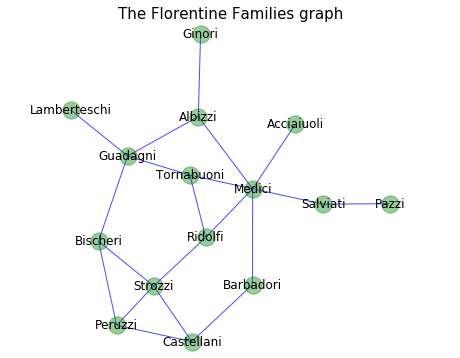

In [3]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

nc=nx.graph_number_of_cliques(G)
print("Number of cliques of the %s is %i" %(name,nc))
print("The clique number of the %s is %i" %(name,nx.graph_clique_number(G)))
cliques=list(nx.find_cliques(G))
cliques=sorted(cliques, key=lambda l: (len(l), l),reverse=True)
c_d={}
xs=range(1,nc+2)
for i in xs[::-1]:
    t=[]
    for c in cliques:
        if len(c)==i:
            t.append(c)
    if len(t)>0:
        c_d[i]=len(t)
for k,v in c_d.items():
    print("There are %i cliques of size %i (%i-cliques)" %(v,k,k))
print("All the cliques are:")
for i,c in enumerate(cliques):
    print("%i. %s" %((i+1),c))
    
pos=graphviz_layout(G)
plt.figure(figsize=(8,6));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');
plt.title("The "+name,fontsize=15);
plt.margins(x=0.2, y=0.03)

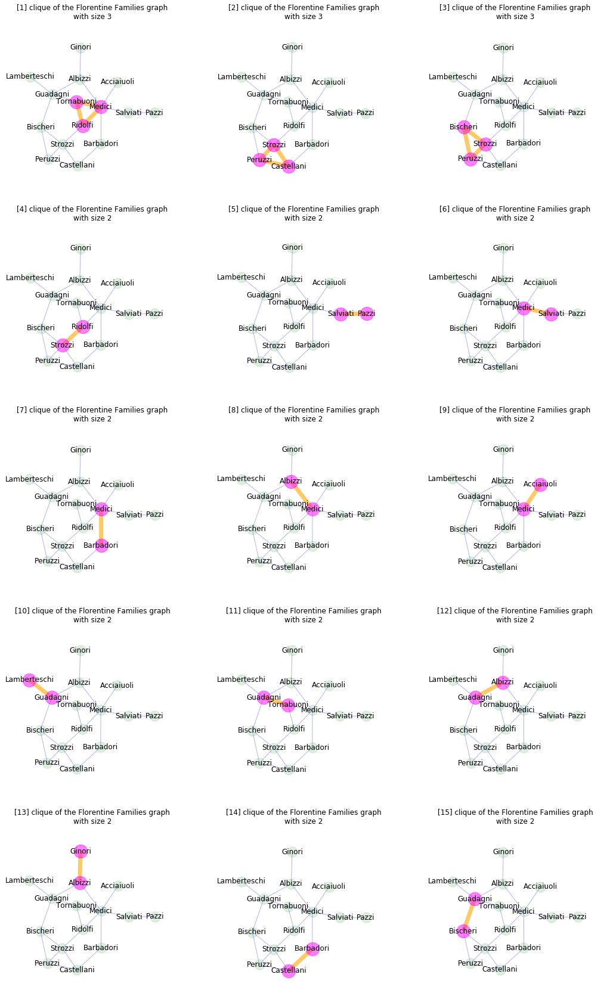

In [4]:
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(cliques)):
    plt.subplot(r,3,i+1);
    outn=[n for n in G.nodes() if n not in j]
    ine=[e for e in G.edges() if e[0] in j and e[1] in j]
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] clique of the %s\nwith size %i" %(i+1,name,len(j))
    plt.title(st)
    plt.axis('off');
    plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

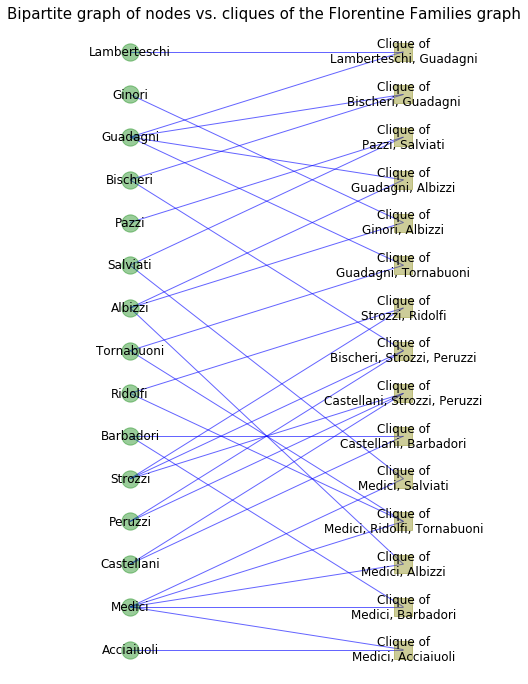

In [5]:
X=G.nodes()
Y=[]
eds=[]
for k,v in nx.cliques_containing_node(G).items():
    for vv in v:
        vv="Clique of\n"+", ".join(vv)
        if vv not in Y:
            Y.append(vv)
        eds.append((k,vv))
Gbpc=nx.Graph()
Gbpc.add_nodes_from(X, bipartite=0)
Gbpc.add_nodes_from(Y, bipartite=1)
Gbpc.add_edges_from(eds)

pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
    
plt.figure(figsize=(8,12));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of the %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

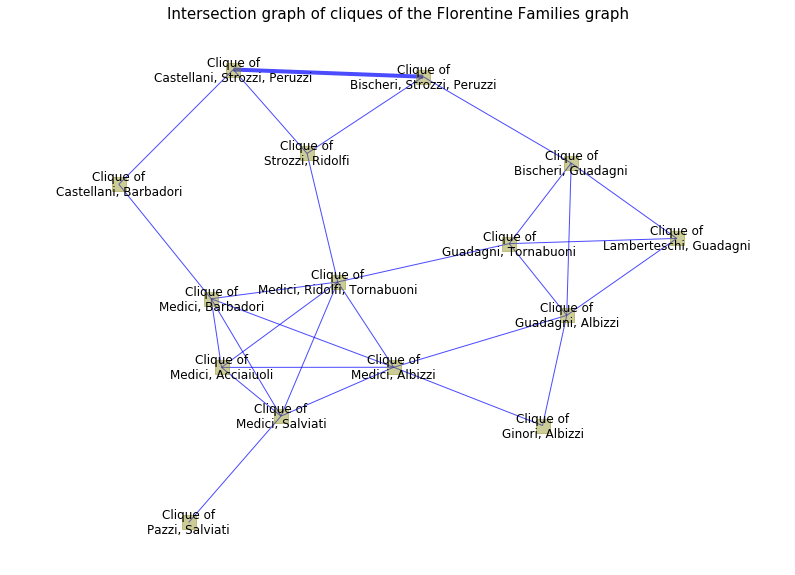

In [6]:
ceds=[]
namedcliques=[n for n, d in Gbpc.nodes(data=True) if d["bipartite"] == 1]
lcliques=[x.replace('Clique of\n',"").split(", ") for x in namedcliques]
for j in list(itertools.combinations(lcliques,2)):
    ints=set(j[0]).intersection(set(j[1]))
    if len(ints)>0:
        ceds.append(("Clique of\n"+", ".join(j[0]),"Clique of\n"+", ".join(j[1]),len(ints)))
# print(len(ceds))
Gintrs=nx.Graph()
Gintrs.add_weighted_edges_from(ceds)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
u_edge_width=[]
for w in edge_width:
    if w==2:
        w=2*w
        u_edge_width.append(w)
    else:
        u_edge_width.append(w)

pos=graphviz_layout(Gintrs)
# print(pos["Clique of\nGuadagni, Albizzi"])
# pos["Clique of\nGuadagni, Albizzi"]=(309.07, 270)
plt.figure(figsize=(14,10));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=u_edge_width, edge_color="b", alpha=0.7)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
nx.draw_networkx_labels(Gintrs, pos);
# yoffset = {}
# y_off=-15
# for k, v in pos.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gintrs, yoffset,font_size=11);
plt.margins(x=0.2, y=0.1) 

### Cliques of the Karate Club Graph

Number of cliques of the Karate Club graph is 36
The clique number of the Karate Club graph is 5
There are 2 cliques of size 5 (5-cliques)
There are 2 cliques of size 4 (4-cliques)
There are 21 cliques of size 3 (3-cliques)
There are 11 cliques of size 2 (2-cliques)
All the cliques are:
1. [0, 1, 2, 3, 13]
2. [0, 1, 2, 3, 7]
3. [33, 32, 23, 29]
4. [33, 32, 8, 30]
5. [33, 32, 31]
6. [33, 32, 22]
7. [33, 32, 20]
8. [33, 32, 18]
9. [33, 32, 15]
10. [33, 32, 14]
11. [33, 28, 31]
12. [33, 27, 23]
13. [33, 26, 29]
14. [24, 25, 31]
15. [5, 16, 6]
16. [2, 32, 8]
17. [0, 12, 3]
18. [0, 8, 2]
19. [0, 5, 10]
20. [0, 5, 6]
21. [0, 4, 10]
22. [0, 4, 6]
23. [0, 1, 21]
24. [0, 1, 19]
25. [0, 1, 17]
26. [33, 19]
27. [33, 13]
28. [33, 9]
29. [25, 23]
30. [24, 27]
31. [2, 28]
32. [2, 27]
33. [2, 9]
34. [1, 30]
35. [0, 31]
36. [0, 11]


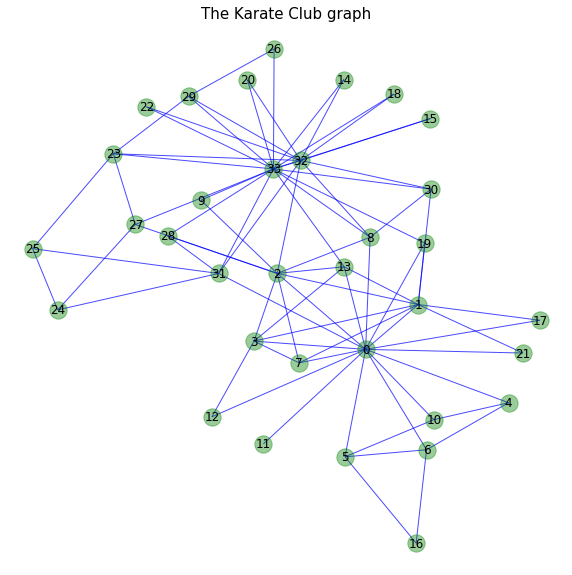

In [7]:
G=nx.karate_club_graph()
name = "Karate Club graph"

nc=nx.graph_number_of_cliques(G)
print("Number of cliques of the %s is %i" %(name,nc))
print("The clique number of the %s is %i" %(name,nx.graph_clique_number(G)))
cliques=list(nx.find_cliques(G))
cliques=sorted(cliques, key=lambda l: (len(l), l),reverse=True)
c_d={}
xs=range(1,nc+2)
for i in xs[::-1]:
    t=[]
    for c in cliques:
        if len(c)==i:
            t.append(c)
    if len(t)>0:
        c_d[i]=len(t)
for k,v in c_d.items():
    print("There are %i cliques of size %i (%i-cliques)" %(v,k,k))
print("All the cliques are:")
for i,c in enumerate(cliques):
    print("%i. %s" %((i+1),c))

pos=graphviz_layout(G)
plt.figure(figsize=(10,10));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');
plt.title("The "+name,fontsize=15);
# plt.margins(x=0.2, y=0.2)

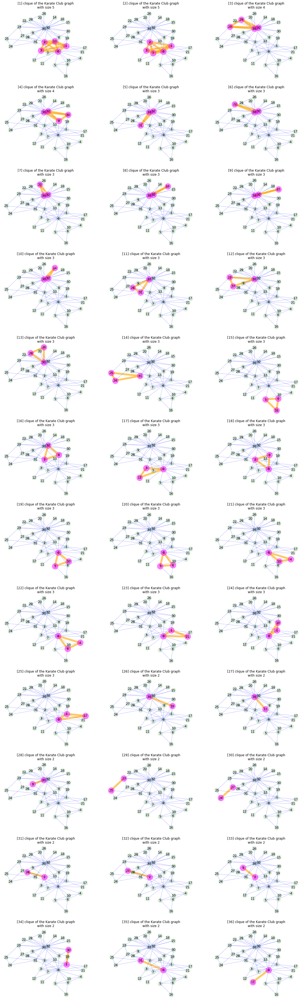

In [8]:
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(20,2*len(G)), sharex=True)
for i,j in list(enumerate(cliques)):
    plt.subplot(r,3,i+1);
    outn=[n for n in G.nodes() if n not in j]
    ine=[e for e in G.edges() if e[0] in j and e[1] in j]
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] clique of the %s\nwith size %i" %(i+1,name,len(j))
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)

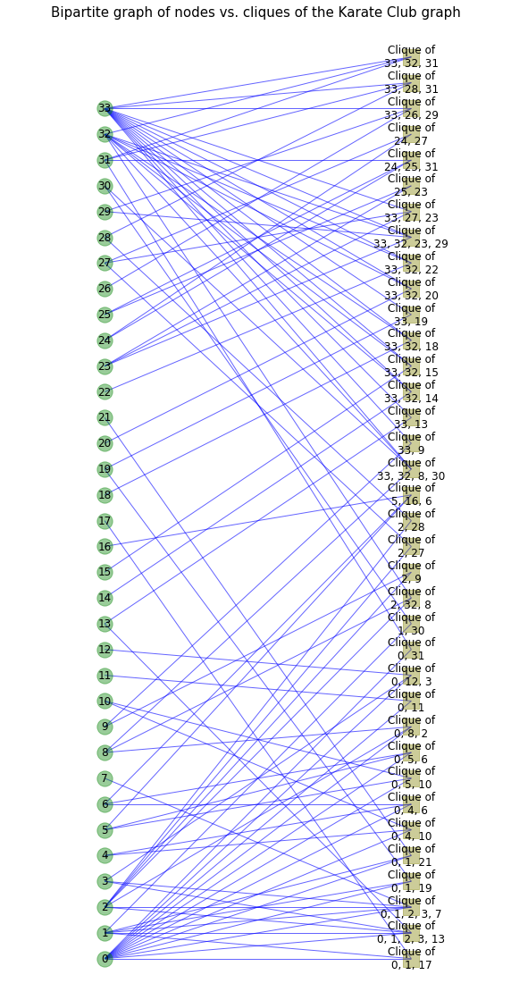

In [9]:
X=G.nodes()
Y=[]
eds=[]
for k,v in nx.cliques_containing_node(G).items():
    for vv in v:
        vv=[str(x) for x in vv]
        vv="Clique of\n"+", ".join(vv)
        if vv not in Y:
            Y.append(vv)
        eds.append((k,vv))
Gbpc=nx.Graph()
Gbpc.add_nodes_from(X, bipartite=0)
Gbpc.add_nodes_from(Y, bipartite=1)
Gbpc.add_edges_from(eds)

pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
    
plt.figure(figsize=(10,20));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of the %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

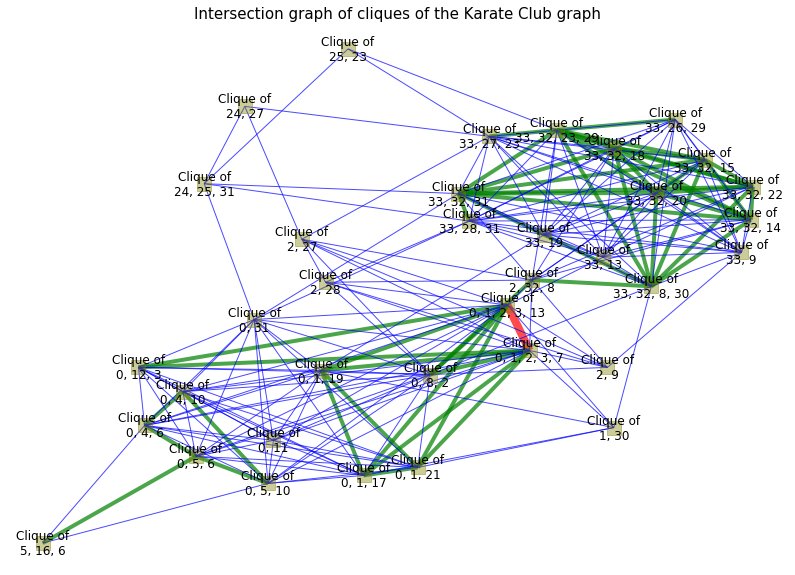

In [10]:
ceds=[]
namedcliques=[n for n, d in Gbpc.nodes(data=True) if d["bipartite"] == 1]
lcliques=[x.replace('Clique of\n',"").split(", ") for x in namedcliques]
for j in list(itertools.combinations(lcliques,2)):
    ints=set(j[0]).intersection(set(j[1]))
    if len(ints)>0:
        ceds.append(("Clique of\n"+", ".join(j[0]),"Clique of\n"+", ".join(j[1]),len(ints)))
# print(len(ceds))
Gintrs=nx.Graph()
Gintrs.add_weighted_edges_from(ceds)

# edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
# edge_width=[w for w in edge_width]
# # print(Counter(edge_width))

E2=[]
for e in Gintrs.edges(data=True):
    if e[2]['weight']==2:
        E2.append(e)
E4=[] #[('Clique of\n0, 1, 2, 3, 13', 'Clique of\n0, 1, 2, 3, 7')]
for e in Gintrs.edges(data=True):
    if e[2]['weight']==4:
        E4.append(e)
E1=[] #[e for e in Gintrs.edges() if e not in E2 and e not in E4]
for e in Gintrs.edges(data=True):
    if e[2]['weight']==1:
        E1.append(e)
        
pos=graphviz_layout(Gintrs)
x='Clique of\n0, 1, 2, 3, 13'
pos[x]=[pos[x][0]+40,pos[x][1]+30]
x='Clique of\n0, 1, 2, 3, 7'
pos[x]=[pos[x][0]+40,pos[x][1]+30]

plt.figure(figsize=(14,10));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,edgelist=E4,width=8, edge_color="r", alpha=0.7)
nx.draw_networkx_edges(Gintrs, pos,edgelist=E2,width=4, edge_color="g", alpha=0.7)
nx.draw_networkx_edges(Gintrs, pos,edgelist=E1,width=1, edge_color="b", alpha=0.7)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
nx.draw_networkx_labels(Gintrs, pos);
# yoffset = {}
# y_off=-15
# for k, v in pos.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gintrs, yoffset,font_size=11);
# plt.margins(x=0.2, y=0.1) 

### An Erdos-Renyi Random Graph

Number of cliques of the Erdos-Renyi random graph is 25
The clique number of the Erdos-Renyi random graph is 4
There are 1 cliques of size 4 (4-cliques)
There are 8 cliques of size 3 (3-cliques)
There are 16 cliques of size 2 (2-cliques)
All the cliques are:
1. [12, 5, 17, 19]
2. [17, 5, 20]
3. [15, 6, 13]
4. [15, 4, 10]
5. [11, 19, 12]
6. [7, 17, 20]
7. [7, 17, 12]
8. [1, 19, 8]
9. [1, 19, 5]
10. [20, 8]
11. [19, 6]
12. [18, 10]
13. [17, 10]
14. [15, 16]
15. [15, 8]
16. [15, 5]
17. [9, 16]
18. [9, 8]
19. [7, 16]
20. [3, 10]
21. [3, 6]
22. [2, 18]
23. [2, 16]
24. [1, 7]
25. [0, 14]


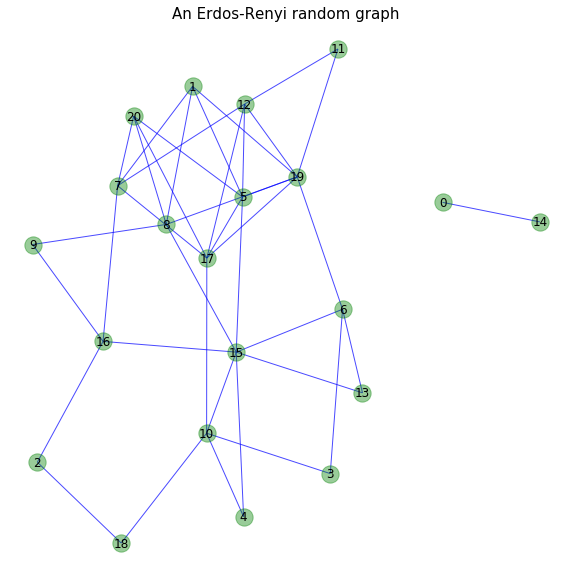

In [11]:
while True:
    n=random.randint(15,26)
    p=random.uniform(0.1,0.2)
    G = nx.erdos_renyi_graph(n,p)
    if nx.is_connected(G)==False and len(list(nx.isolates(G)))==0 and nx.graph_clique_number(G)>3:
        break
name = "Erdos-Renyi random graph"

nc=nx.graph_number_of_cliques(G)
print("Number of cliques of the %s is %i" %(name,nc))
print("The clique number of the %s is %i" %(name,nx.graph_clique_number(G)))
cliques=list(nx.find_cliques(G))
cliques=sorted(cliques, key=lambda l: (len(l), l),reverse=True)
c_d={}
xs=range(1,nc+2)
for i in xs[::-1]:
    t=[]
    for c in cliques:
        if len(c)==i:
            t.append(c)
    if len(t)>0:
        c_d[i]=len(t)
for k,v in c_d.items():
    print("There are %i cliques of size %i (%i-cliques)" %(v,k,k))
print("All the cliques are:")
for i,c in enumerate(cliques):
    print("%i. %s" %((i+1),c))

pos=graphviz_layout(G)
plt.figure(figsize=(10,10));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');
plt.title("An "+name,fontsize=15);
# plt.margins(x=0.2, y=0.2)

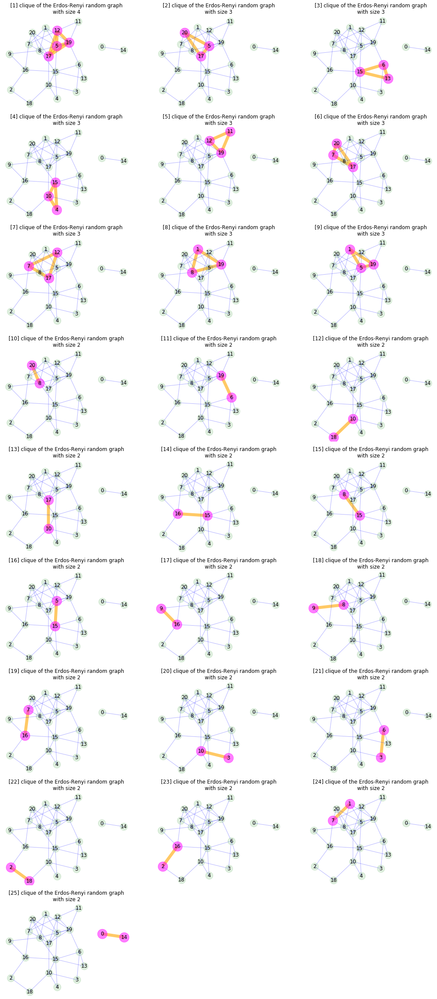

In [12]:
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(cliques)):
    plt.subplot(r,3,i+1);
    outn=[n for n in G.nodes() if n not in j]
    ine=[e for e in G.edges() if e[0] in j and e[1] in j]
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] clique of the %s\nwith size %i" %(i+1,name,len(j))
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
    ax[r-1,1].set_visible(False)
    ax[r-1,2].set_visible(False)

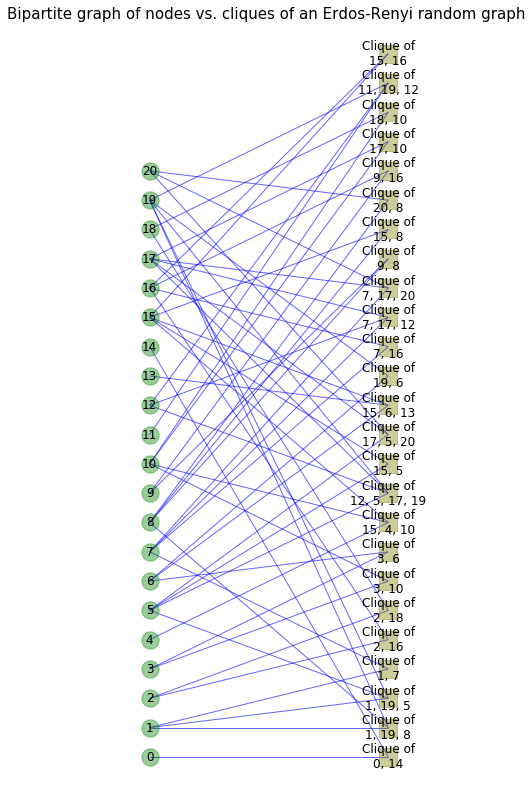

In [13]:
X=G.nodes()
Y=[]
eds=[]
for k,v in nx.cliques_containing_node(G).items():
    for vv in v:
        vv=[str(x) for x in vv]
        vv="Clique of\n"+", ".join(vv)
        if vv not in Y:
            Y.append(vv)
        eds.append((k,vv))
Gbpc=nx.Graph()
Gbpc.add_nodes_from(X, bipartite=0)
Gbpc.add_nodes_from(Y, bipartite=1)
Gbpc.add_edges_from(eds)

pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
    
plt.figure(figsize=(7,14));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of an %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

Counter({1: 62, 2: 7})


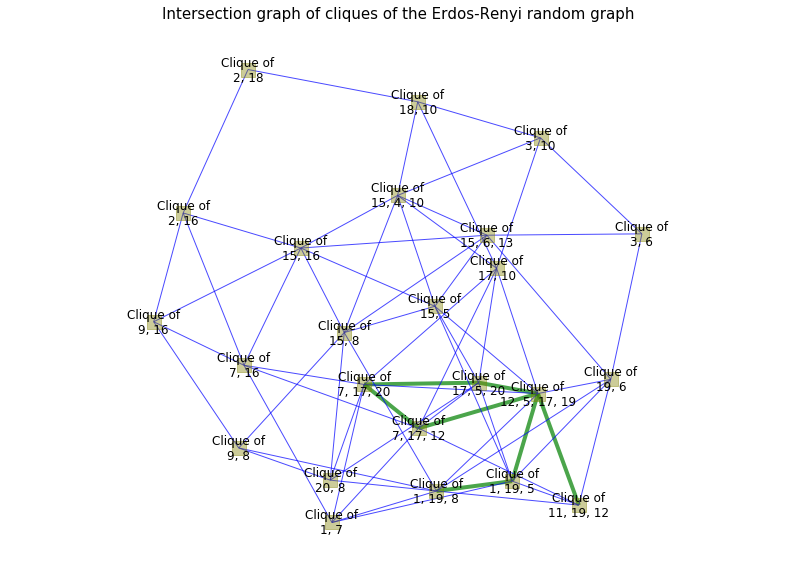

In [14]:
ceds=[]
namedcliques=[n for n, d in Gbpc.nodes(data=True) if d["bipartite"] == 1]
lcliques=[x.replace('Clique of\n',"").split(", ") for x in namedcliques]
for j in list(itertools.combinations(lcliques,2)):
    ints=set(j[0]).intersection(set(j[1]))
    if len(ints)>0:
        ceds.append(("Clique of\n"+", ".join(j[0]),"Clique of\n"+", ".join(j[1]),len(ints)))
# print(len(ceds))
Gintrs=nx.Graph()
Gintrs.add_weighted_edges_from(ceds)

edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))

E2=[]
for e in Gintrs.edges(data=True):
    if e[2]['weight']==2:
        E2.append(e)
E3=[] 
for e in Gintrs.edges(data=True):
    if e[2]['weight']==3:
        E3.append(e)
E1=[] #[e for e in Gintrs.edges() if e not in E2 and e not in E4]
for e in Gintrs.edges(data=True):
    if e[2]['weight']==1:
        E1.append(e)
        
pos=graphviz_layout(Gintrs)
# x='Clique of\n0, 1, 2, 3, 13'
# pos[x]=[pos[x][0]+40,pos[x][1]+30]
# x='Clique of\n0, 1, 2, 3, 7'
# pos[x]=[pos[x][0]+40,pos[x][1]+30]

plt.figure(figsize=(14,10));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,edgelist=E3,width=6, edge_color="r", alpha=0.7)
nx.draw_networkx_edges(Gintrs, pos,edgelist=E2,width=4, edge_color="g", alpha=0.7)
nx.draw_networkx_edges(Gintrs, pos,edgelist=E1,width=1, edge_color="b", alpha=0.7)
# nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.7)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
nx.draw_networkx_labels(Gintrs, pos);
# yoffset = {}
# y_off=-15
# for k, v in pos.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gintrs, yoffset,font_size=11);
plt.margins(x=0.3, y=0.1)  

<a id='2'></a>
## <span style="color:green">2. Clustering</span>

Let $G = (V,E)$ be a graph and $u ∈ V$ a node.


The **local clustering coefficient** of node $u$ is defined as the proportion of the number of links between the neighbors of $u$ divided by the number of links that could possibly exist between these neighbors:

$$C(u) = \frac{2|\{e = (v,w) ∈ E: v, w ∈ N(u)\}|}{deg(u)(deg(u) - 1)},$$

where $N(u)$ denotes the neighborhood of $u$ and $deg(u)$ the degree of $u$. Apparently, this definition refers to an undirected graph, but under the usual modifications it is valid for directed and weighted graphs too (see: G. Fagiolo (2007), "Clustering in complex directed networks," Physical Review E, 76(2), 026107 https://www.iris.sssup.it/retrieve/handle/11382/303163/847/PRE_2007.pdf).

The **global clustering coefficient** is based on triplets of nodes. A triplet is three nodes that are connected by either two (**open triplet**) or three (**closed triplet**) undirected ties. A triangle in the graph therefore includes three closed triplets, one centered on each of the nodes. The global clustering coefficient of the graph $G$ is then defined as:

$$C = \frac{\mbox{number of closed triplets}}{\mbox{number of all triplets (open and closed)}} = \frac{\mbox{3 $\times$ number of triangles}}{\mbox{number of all triplets}}$$

This has been generalized to weighted graphs by Tore Opsahl & Pietro Panzarasa (2009), "Clustering in Weighted Networks," Social Networks, 31(2): 155–163. doi:10.1016/j.socnet.2009.02.002.

The **graph average clustering coefficient** is defined as the average of the local clustering coefficients of all the vertices of the graph:

$$\bar{C} = \frac{1}{n} \sum_{u ∈ V} C(u)$$

where $n$ is the number of nodes of the graph (i.e., $|V| = n$).

In [15]:
def global_clustering_coefficient(G):
    # It is extremely slow for graphs with more than 20 nodes!
    triplets=[]
    for i in G.nodes():
        for j in G.nodes:
            if j!=i:
                for path in nx.all_simple_paths(G, source=i, target=j):
                    if len(path)==3:
                        triplets.append(path)
    for path in triplets:
        if path[::-1] in triplets:
            triplets.remove(path[::-1])
    a=sum(nx.triangles(G).values())/3
    b=len(triplets)
    if b!=0:
        C=3*a/b
    else:
        C=0
    return C

### The Florentine Families Graph

Global clustering coefficient of the Florentine Families graph = 0.19
Average clustering coefficient of the Florentine Families graph = 0.16


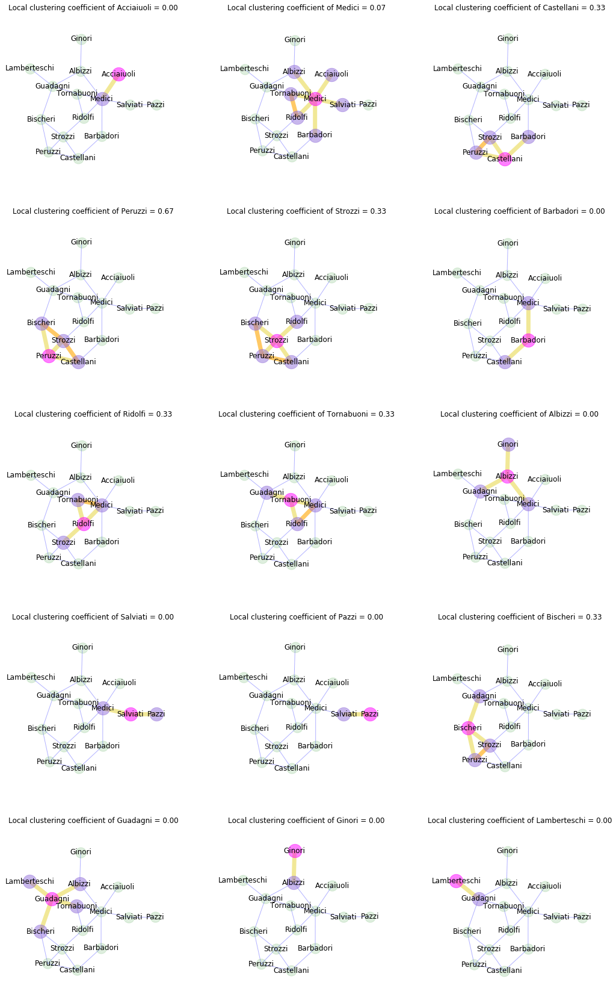

In [16]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

print("Global clustering coefficient of the %s = %.2f" %(name,global_clustering_coefficient(G)))
print("Average clustering coefficient of the %s = %.2f" %(name,nx.average_clustering(G)))

nc=len(G.nodes)
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(G.nodes)):
    plt.subplot(r,3,i+1);
    cc=nx.clustering(G,j)
    neighs=list(nx.neighbors(G,j))
    cneighs=neighs+[j]
    eneighs=[]
    for e in G.edges():
        if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
            eneighs.append(e)
    eneighs1=[]
    for k in itertools.combinations(neighs, 2):
        if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
            eneighs1.append(k)
    outneighs=[n for n in G.nodes() if n not in cneighs]
    outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
    plt.title(st)
    plt.axis('off');
    plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

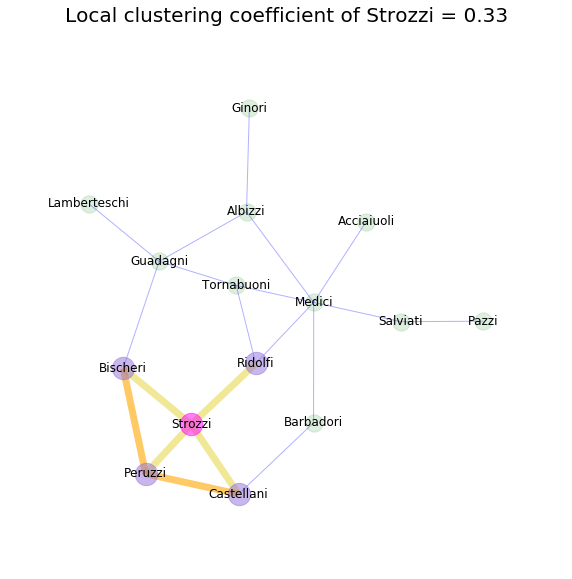

In [17]:
plt.figure(figsize=(10,10));
pos=graphviz_layout(G)
j='Strozzi'
cc=nx.clustering(G,j)
neighs=list(nx.neighbors(G,j))
cneighs=neighs+[j]
eneighs=[]
for e in G.edges():
    if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
        eneighs.append(e)
eneighs1=[]
for k in itertools.combinations(neighs, 2):
    if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
        eneighs1.append(k)
outneighs=[n for n in G.nodes() if n not in cneighs]
outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
nx.draw_networkx_labels(G, pos)
st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
plt.title(st,fontsize=20)
plt.axis('off');
plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

### The Karate Club Graph

Average clustering coefficient of the Karate Club graph = 0.57


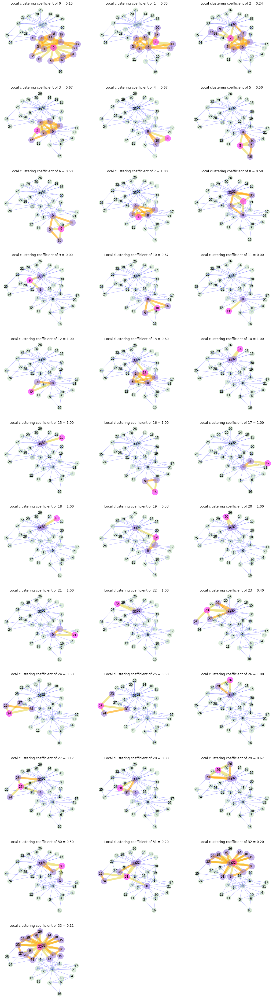

In [18]:
G=nx.karate_club_graph()
name = "Karate Club graph"

print("Average clustering coefficient of the %s = %.2f" %(name,nx.average_clustering(G)))

nc=len(G.nodes)
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(G.nodes)):
    plt.subplot(r,3,i+1);
    cc=nx.clustering(G,j)
    neighs=list(nx.neighbors(G,j))
    cneighs=neighs+[j]
    eneighs=[]
    for e in G.edges():
        if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
            eneighs.append(e)
    eneighs1=[]
    for k in itertools.combinations(neighs, 2):
        if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
            eneighs1.append(k)
    outneighs=[n for n in G.nodes() if n not in cneighs]
    outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
    ax[r-1,1].set_visible(False)
    ax[r-1,-1].set_visible(False)

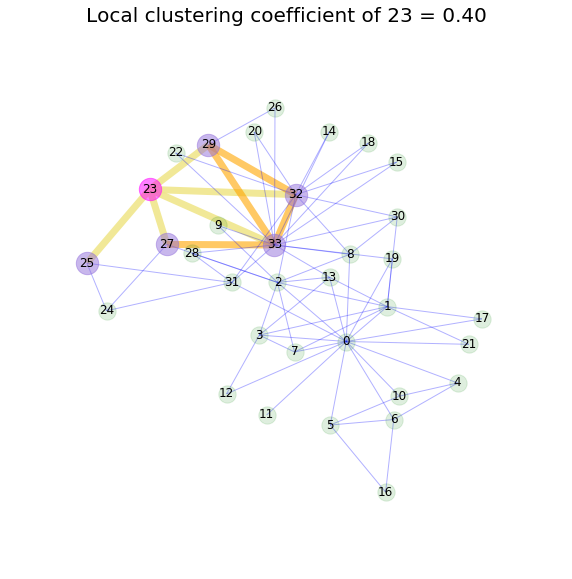

In [19]:
plt.figure(figsize=(10,10));
pos=graphviz_layout(G)
# print(pos[33])
pos[33]=(157.52, 280)
j=23
cc=nx.clustering(G,j)
neighs=list(nx.neighbors(G,j))
cneighs=neighs+[j]
eneighs=[]
for e in G.edges():
    if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
        eneighs.append(e)
eneighs1=[]
for k in itertools.combinations(neighs, 2):
    if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
        eneighs1.append(k)
outneighs=[n for n in G.nodes() if n not in cneighs]
outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
nx.draw_networkx_labels(G, pos)
st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
plt.title(st,fontsize=20)
plt.axis('off');
plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

### A Undirected Erdos-Renyi Random Graph

In [20]:
while True:
    n=random.randint(12,18)
    p=random.uniform(0.1,0.2)
    G = nx.erdos_renyi_graph(n,p)
    if nx.is_connected(G)==True:
        break
name = "Erdos-Renyi random graph"

print("Global clustering coefficient of the %s = %.2f" %(name,global_clustering_coefficient(G)))
print("Average clustering coefficient of the %s = %.2f" %(name,nx.average_clustering(G)))

Global clustering coefficient of the Erdos-Renyi random graph = 0.00
Average clustering coefficient of the Erdos-Renyi random graph = 0.00


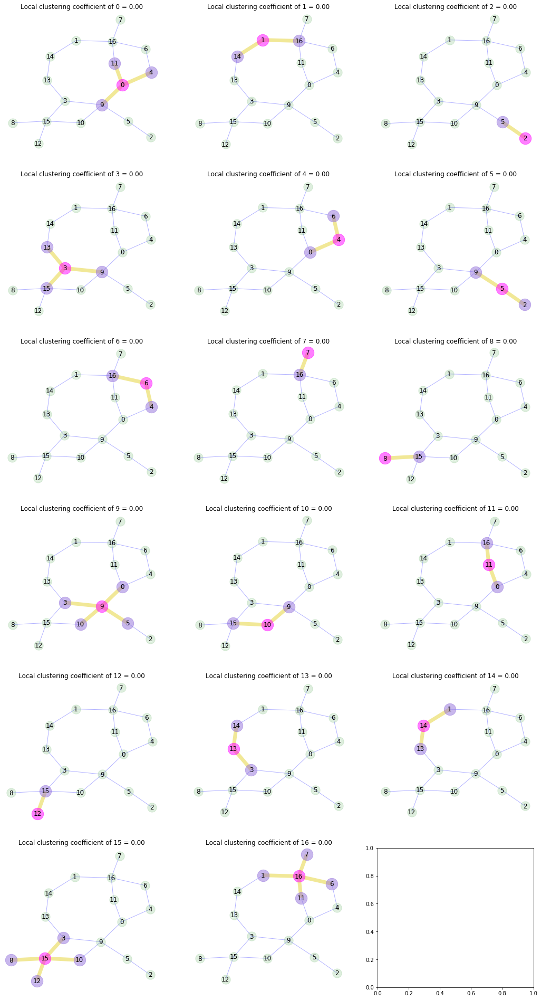

In [21]:
nc=len(G.nodes)
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(G.nodes)):
    plt.subplot(r,3,i+1);
    cc=nx.clustering(G,j)
    neighs=list(nx.neighbors(G,j))
    cneighs=neighs+[j]
    eneighs=[]
    for e in G.edges():
        if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
            eneighs.append(e)
    eneighs1=[]
    for k in itertools.combinations(neighs, 2):
        if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
            eneighs1.append(k)
    outneighs=[n for n in G.nodes() if n not in cneighs]
    outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
    nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=outeneighs,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    if cc>0:
        st="Local clustering coefficient of %s = %.2f\n%s" %(j,cc,eneighs1)
    else:
        st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)
#     ax[r-1,-1].set_visible(False)

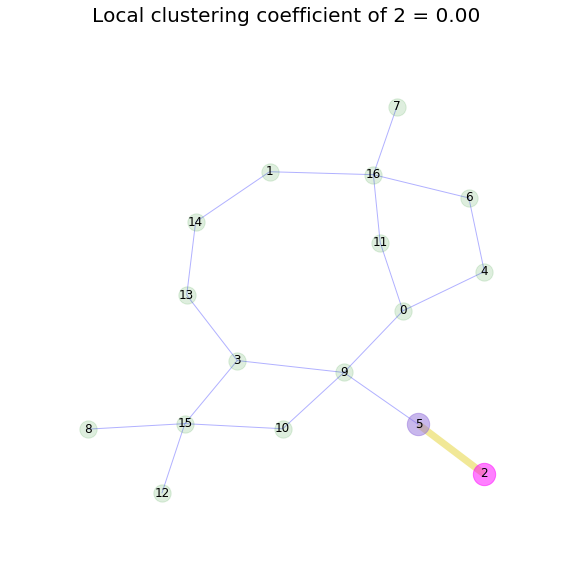

In [22]:
plt.figure(figsize=(10,10));
pos=graphviz_layout(G)
# print(pos[33])
# pos[33]=(157.52, 280)
j=2
cc=nx.clustering(G,j)
neighs=list(nx.neighbors(G,j))
cneighs=neighs+[j]
eneighs=[]
for e in G.edges():
    if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
        eneighs.append(e)
eneighs1=[]
for k in itertools.combinations(neighs, 2):
    if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
        eneighs1.append(k)
outneighs=[n for n in G.nodes() if n not in cneighs]
outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
nx.draw_networkx_labels(G, pos)
st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
plt.title(st,fontsize=20)
plt.axis('off');
plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

### A Directed Gnm Random Graph

In [23]:
while True:
    n=random.randint(15,26)
    m=random.randint(30,41)
    G = nx.gnm_random_graph(n, m, directed=True)
    if nx.is_weakly_connected(G)==True:
        break
name = "directed Gnm random graph"

print("Average clustering coefficient of the %s = %.2f" %(name,nx.average_clustering(G)))

Average clustering coefficient of the directed Gnm random graph = 0.07


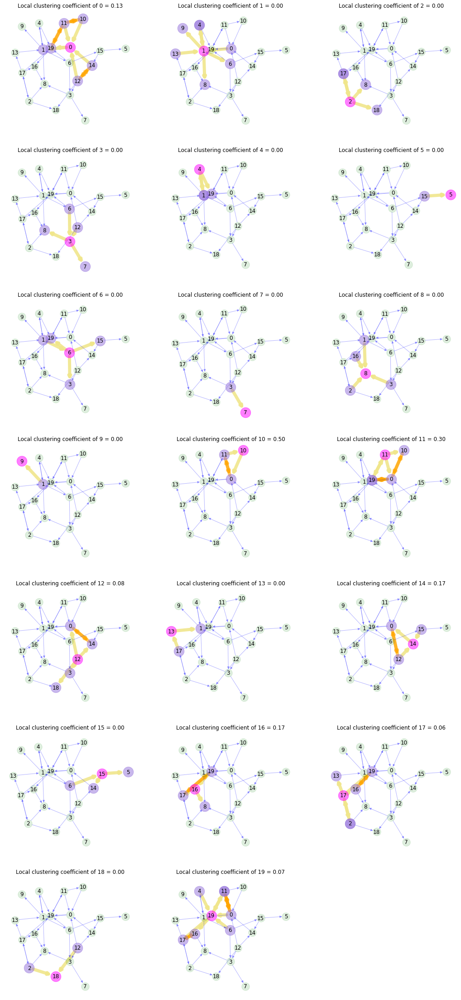

In [24]:
nc=len(G.nodes)
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(G.nodes)):
    plt.subplot(r,3,i+1);
    cc=nx.clustering(G,j)
    neighsin=list(G.predecessors(j))
    neighsout=list(G.successors(j))
    neighs=neighsin+neighsout
    cneighs=neighs+[j]
    eneighs=[]
    for e in G.edges():
        if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
            eneighs.append(e)
    eneighs1=[]
    for k in itertools.permutations(neighs, 2):
        if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
            eneighs1.append(k)
    outneighs=[n for n in G.nodes() if n not in cneighs]
    outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
    nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
#     if cc>0:
#         st="Local clustering coefficient of %s = %.2f" %(j,cc) #,eneighs1) \n%s
#     else:
#         st="Local clustering coefficient of %s = %.2f" %(j,cc)
# #     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
    st="Local clustering coefficient of %s = %.2f" %(j,cc)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)
    ax[r-1,-1].set_visible(False)

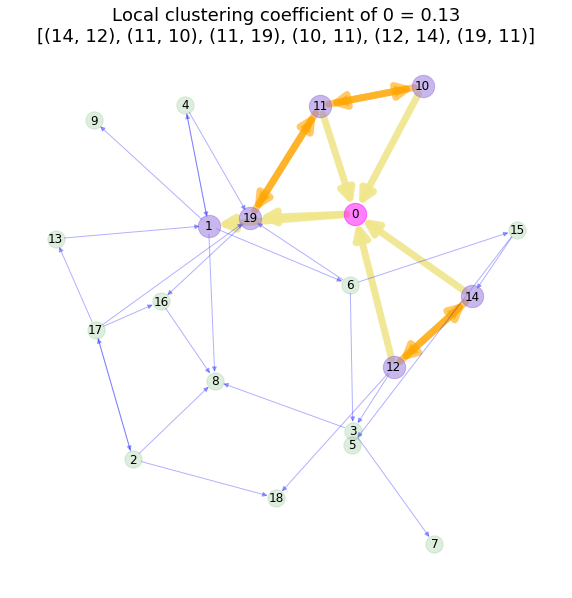

In [25]:
plt.figure(figsize=(10,10));
pos=graphviz_layout(G)
# print(pos[5])
pos[5]=(198.59, 80)
j=0
# print(list(G.predecessors(j)))
# print(list(G.successors(j)))
cc=nx.clustering(G,j)
neighsin=list(G.predecessors(j))
neighsout=list(G.successors(j))
neighs=neighsin+neighsout
cneighs=neighs+[j]
eneighs=[]
for e in G.edges():
    if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
        eneighs.append(e)
eneighs1=[]
for k in itertools.permutations(neighs, 2):
    if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
        eneighs1.append(k)
outneighs=[n for n in G.nodes() if n not in cneighs]
outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
nx.draw_networkx_edges(G, pos, arrowsize=30,edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
nx.draw_networkx_edges(G, pos, arrowsize=30,edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
nx.draw_networkx_labels(G, pos)
if cc>0:
    st="Local clustering coefficient of %s = %.2f\n%s" %(j,cc,eneighs1)
else:
    st="Local clustering coefficient of %s = %.2f" %(j,cc)
#     "%i clique of the %s\nwith size %i" %(i+1,name,len(j))
plt.title(st,fontsize=18)
plt.axis('off');

<a id='3'></a>
## <span style="color:green">3. Triangles</span>

Let $G$ be a graph and $u$ a node.


* A **triangle** is formed by three nodes (called *vertices*) and three edges (called *sides*) that are joining every pair of these three nodes. When $u$ is one of the vertices of a triangle, the triangle is said to pass from $u$. 


* The **transitivity** of graph $G$ is defined as the ratio of the number of triangles divided by the number of all possible triangles. Notice that the number of all possible triangles is equal to the number of all existring *triads* in $G$, where a triad is defined as two edges with a shared node.

### The Florentine Families Graph

There are 3 triangles in the Florentine Families graph:
[['Medici', 'Ridolfi', 'Tornabuoni'], ['Castellani', 'Peruzzi', 'Strozzi'], ['Peruzzi', 'Strozzi', 'Bischeri']]
Transitivity of the Florentine Families graph = 0.191


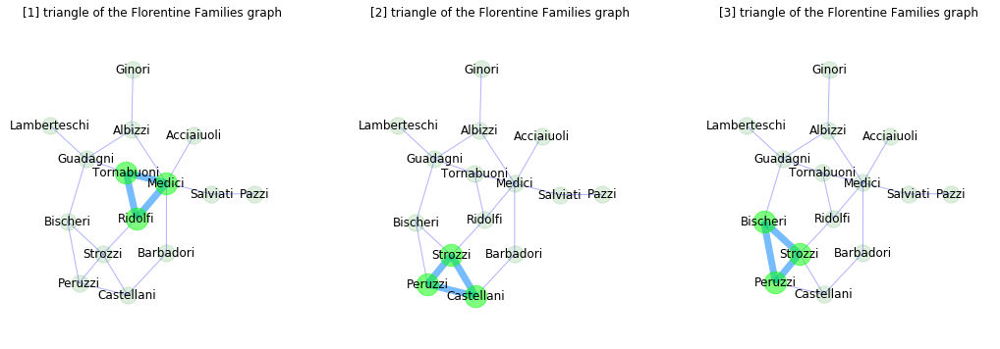

In [26]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

cliques=list(nx.clique.enumerate_all_cliques(G))
triangles=[ z for z in cliques if len(z)==3 ]
nc=len(triangles)

print("There are %i triangles in the %s:\n%s" %(nc,name,triangles))
print("Transitivity of the %s = %.3f" %(name,nx.transitivity(G)))

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,0.4*len(G)), sharex=True)
for i,j in list(enumerate(triangles)):
    plt.subplot(r,3,i+1);
    outn=[n for n in G.nodes() if n not in j]
    ine=[e for e in G.edges() if e[0] in j and e[1] in j]
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] triangle of the %s" %(i+1,name)
    plt.title(st)
    plt.axis('off');
    plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

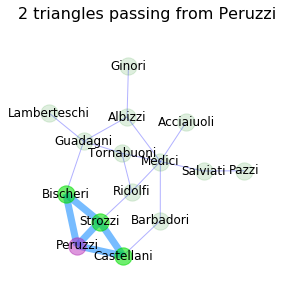

In [27]:
trin = [item for sublist in triangles for item in sublist]
noi=[k for k,v in Counter(trin).items() if v>1]
if len(noi)>0:
    u=random.choice(noi)
else:
    u=random.choice(trin)
triu=[t for t in triangles if u in t]
ntriu=list(set([n for t in triu for n in t if n!=u]))
ine=[e for e in G.edges() if e[0] in ntriu+[u] and e[1] in ntriu+[u]]
oute=[e for e in G.edges() if e not in ine]

pos=graphviz_layout(G)
plt.figure(figsize=(5,5));
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[u],node_color="magenta", alpha=0.4)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=ntriu, node_color="lime", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[n for n in G.nodes() if n not in triu],node_color="g", alpha=0.13)
nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
nx.draw_networkx_labels(G, pos)
st="%i triangles passing from %s" %(len(triu),u)
plt.title(st,fontsize=16)
plt.axis('off');    
plt.margins(x=0.2, y=0.2)

### The Karate Club Graph

There are 45 triangles in the Karate Club graph:
[[0, 1, 2], [0, 1, 3], [0, 1, 7], [0, 1, 13], [0, 1, 17], [0, 1, 19], [0, 1, 21], [0, 2, 3], [0, 2, 7], [0, 2, 8], [0, 2, 13], [0, 3, 7], [0, 3, 12], [0, 3, 13], [0, 4, 6], [0, 4, 10], [0, 5, 6], [0, 5, 10], [1, 2, 3], [1, 2, 7], [1, 2, 13], [1, 3, 7], [1, 3, 13], [2, 3, 7], [2, 3, 13], [2, 8, 32], [5, 6, 16], [8, 30, 32], [8, 30, 33], [8, 32, 33], [14, 32, 33], [15, 32, 33], [18, 32, 33], [20, 32, 33], [22, 32, 33], [23, 27, 33], [23, 29, 32], [23, 29, 33], [23, 32, 33], [24, 25, 31], [26, 29, 33], [28, 31, 33], [29, 32, 33], [30, 32, 33], [31, 32, 33]]
Transitivity of the Karate Club graph = 0.256


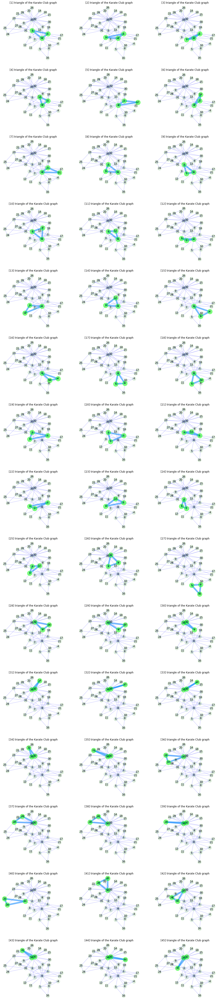

In [28]:
G=nx.karate_club_graph()
name = "Karate Club graph"

cliques=list(nx.clique.enumerate_all_cliques(G))
triangles=[ z for z in cliques if len(z)==3 ]
nc=len(triangles)

print("There are %i triangles in the %s:\n%s" %(nc,name,triangles))
print("Transitivity of the %s = %.3f" %(name,nx.transitivity(G)))

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2.5*len(G)), sharex=True)
for i,j in list(enumerate(triangles)):
    plt.subplot(r,3,i+1);
    outn=[n for n in G.nodes() if n not in j]
    ine=[e for e in G.edges() if e[0] in j and e[1] in j]
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] triangle of the %s" %(i+1,name)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)

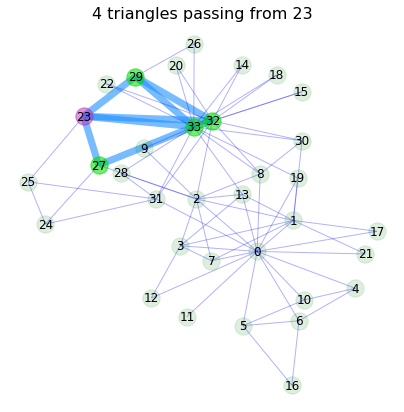

In [29]:
trin = [item for sublist in triangles for item in sublist]
noi=[k for k,v in Counter(trin).items() if v>1]
if len(noi)>0:
    u=random.choice(noi)
else:
    u=random.choice(trin)
triu=[t for t in triangles if u in t]
ntriu=list(set([n for t in triu for n in t if n!=u]))
ine=[e for e in G.edges() if e[0] in ntriu+[u] and e[1] in ntriu+[u]]
oute=[e for e in G.edges() if e not in ine]

pos=graphviz_layout(G)
plt.figure(figsize=(7,7));
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[u],node_color="magenta", alpha=0.4)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=ntriu, node_color="lime", alpha=0.5)
nodes = nx.draw_networkx_nodes(G, pos, nodelist=[n for n in G.nodes() if n not in triu],node_color="g", alpha=0.13)
nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
nx.draw_networkx_labels(G, pos)
st="%i triangles passing from %s" %(len(triu),u)
plt.title(st,fontsize=16)
plt.axis('off');    
# plt.margins(x=0.2, y=0.2)

### Triangles in a Directed Gnm Random Graph

#### Directed AND Undirected Triangles

In [30]:
while True:
    n=random.randint(15,26)
    m=random.randint(30,41)
    G = nx.gnm_random_graph(n, m, directed=True)
    uG=nx.Graph(G)
    ucliques=list(nx.clique.enumerate_all_cliques(uG))
    triangles=[ z for z in ucliques if len(z)==3 ]
    if nx.is_weakly_connected(G)==True and len(triangles)>2:
        break

name = "directed Gnm random graph"

ucliques=list(nx.clique.enumerate_all_cliques(uG))
triangles=[ z for z in ucliques if len(z)==3 ]
nc=len(triangles)

print("There are %i triangles in the %s:\n%s" %(nc,name,triangles))
print("Transitivity of the %s = %.3f" %(name,nx.transitivity(G)))

There are 8 triangles in the directed Gnm random graph:
[[0, 1, 10], [0, 4, 10], [0, 4, 14], [1, 2, 12], [2, 5, 11], [2, 11, 12], [4, 7, 9], [7, 8, 13]]
Transitivity of the directed Gnm random graph = 0.140


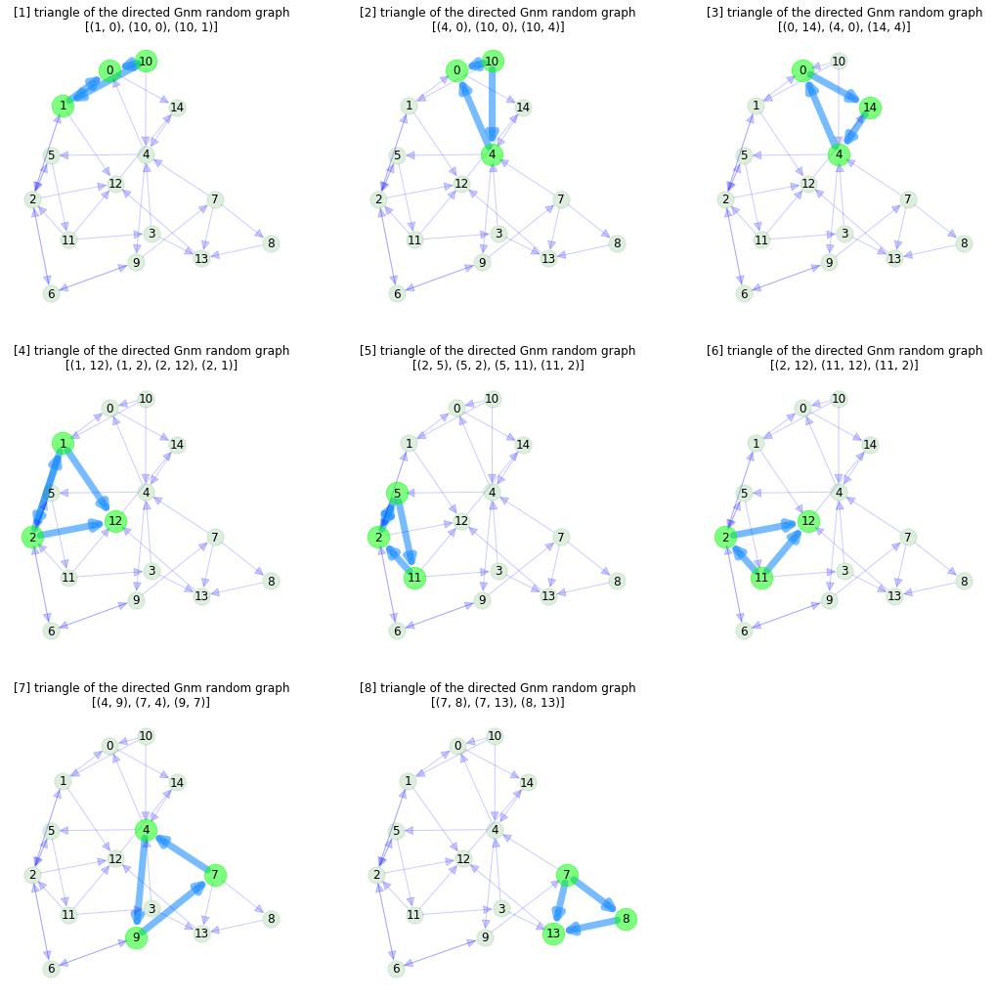

In [31]:
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))

pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,1.2*len(G)), sharex=True)
for i,j in list(enumerate(triangles)):
    plt.subplot(r,3,i+1);
    outn=[n for n in G.nodes() if n not in j]
    ine=[e for e in G.edges() if e[0] in j and e[1] in j]
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=oute,edge_color="b", alpha=0.2)
    nx.draw_networkx_labels(G, pos)
    st="[%i] triangle of the %s\n%s" %(i+1,name,ine)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
    ax[r-1,1].set_visible(False)
    ax[r-1,2].set_visible(False)

#### Directed Triangles (ONLY)

In [32]:
# while True:
#     n=random.randint(15,26)
#     m=random.randint(30,41)
#     G = nx.gnm_random_graph(n, m, directed=True)
#     scycles=list(nx.simple_cycles(G))
#     triangles=[ z for z in scycles if len(z)==3 ]
#     if nx.is_weakly_connected(G)==True and len(triangles)>2:
#         break

# name = "directed Gnm random graph"

scycles=list(nx.simple_cycles(G))
triangles=[ z for z in scycles if len(z)==3 ]
nc=len(triangles)

print("There are %i directed triangles in the %s:\n%s" %(nc,name,triangles))
print("Transitivity of the %s = %.3f" %(name,nx.transitivity(G)))

There are 3 directed triangles in the directed Gnm random graph:
[[0, 14, 4], [2, 5, 11], [4, 9, 7]]
Transitivity of the directed Gnm random graph = 0.140


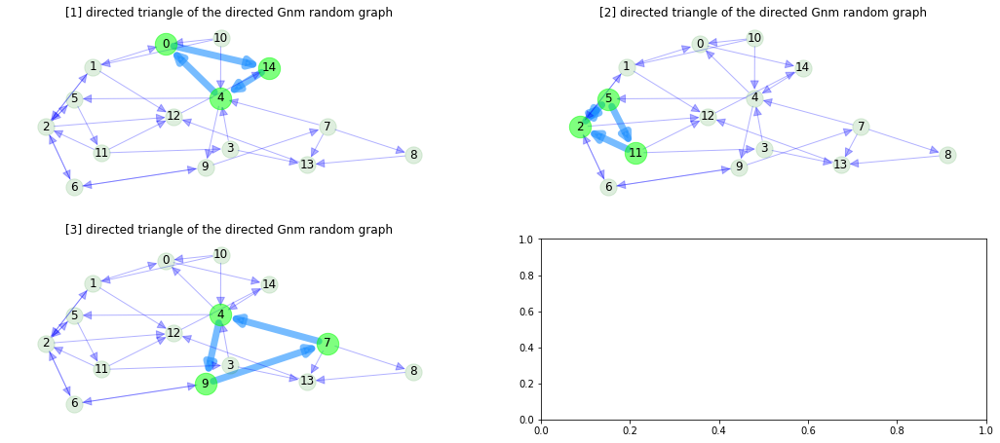

In [33]:
if (nc/2.)%2==0:
    r=int(nc/2.)
else:
    r=int(math.ceil(nc/2.))
pos=graphviz_layout(G)
if r>1:
    fig, ax = plt.subplots(r,2,figsize=(18,0.5*len(G)), sharex=True)
    for i,j in list(enumerate(triangles)):
        plt.subplot(r,2,i+1);
        outn=[n for n in G.nodes() if n not in j]
        ine=[e for e in G.edges() if e[0] in j and e[1] in j]
        oute=[e for e in G.edges() if e not in ine]
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="lime", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
        nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=oute,edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)
        st="[%i] directed triangle of the %s" %(i+1,name)
        plt.title(st)
        plt.axis('off');
    #     ax[r-1,2].set_visible(False)
else:
    fig, ax = plt.subplots(r,1,figsize=(18,0.5*len(G)), sharex=True)
    for i,j in list(enumerate(triangles)):
        plt.subplot(r,2,i+1);
        outn=[n for n in G.nodes() if n not in j]
        ine=[e for e in G.edges() if e[0] in j and e[1] in j]
        oute=[e for e in G.edges() if e not in ine]
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="lime", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
        nx.draw_networkx_edges(G, pos, arrowsize=20,edgelist=oute,edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)
        st="[%i] directed triangle of the %s" %(i+1,name)
        plt.title(st)
        plt.axis('off');
    #     ax[r-1,2].set_visible(False)

<a id='4'></a>
## <span style="color:green">4. Cycles</span>

$k$-**Cycle** in a graph $G$ is a set of nodes $x_1, x_2, \ldots, x_k$ of $G$ such that $(x_1,x_2), (x_2,x_3), \ldots, (x_{k-1},x_k), (x_{k},x_1)$ are all edges of $G$. The integer $k$ is called **length** of the $k$-cycle. If the length $k$ is clear what it is, one simply says **cycles**. Apparently:

* $3$-cycles are **triangles**
* $4$-cycles are **quadrangles**
* $5$-cycles are **pentagons**
* $6$-cycles are **hexagons**, etc.

In [34]:
def cycles2edges(G,cycles):
    eds=[]
    for cycle in cycles:
        for i in range(len(cycle)-1):
            if (cycle[i],cycle[i+1]) in G.edges():
                eds.append((cycle[i],cycle[i+1]))
            if (cycle[i+1],cycle[i]) in G.edges():
                eds.append((cycle[i+1],cycle[i]))
        if (cycle[-1],cycle[0]) in G.edges():
                eds.append((cycle[-1],cycle[0]))
        if (cycle[0],cycle[-1]) in G.edges():
                eds.append((cycle[0],cycle[-1]))
    return eds

### The Florentine Families Graph

The %s contains:
2 3-cycles:
[['Peruzzi', 'Strozzi', 'Bischeri'], ['Peruzzi', 'Castellani', 'Strozzi']]
1 4-cycles:
[['Medici', 'Tornabuoni', 'Guadagni', 'Albizzi']]
1 5-cycles:
[['Tornabuoni', 'Ridolfi', 'Strozzi', 'Bischeri', 'Guadagni']]
1 6-cycles:
[['Medici', 'Ridolfi', 'Strozzi', 'Bischeri', 'Guadagni', 'Albizzi']]
1 7-cycles:
[['Medici', 'Barbadori', 'Castellani', 'Strozzi', 'Bischeri', 'Guadagni', 'Albizzi']]


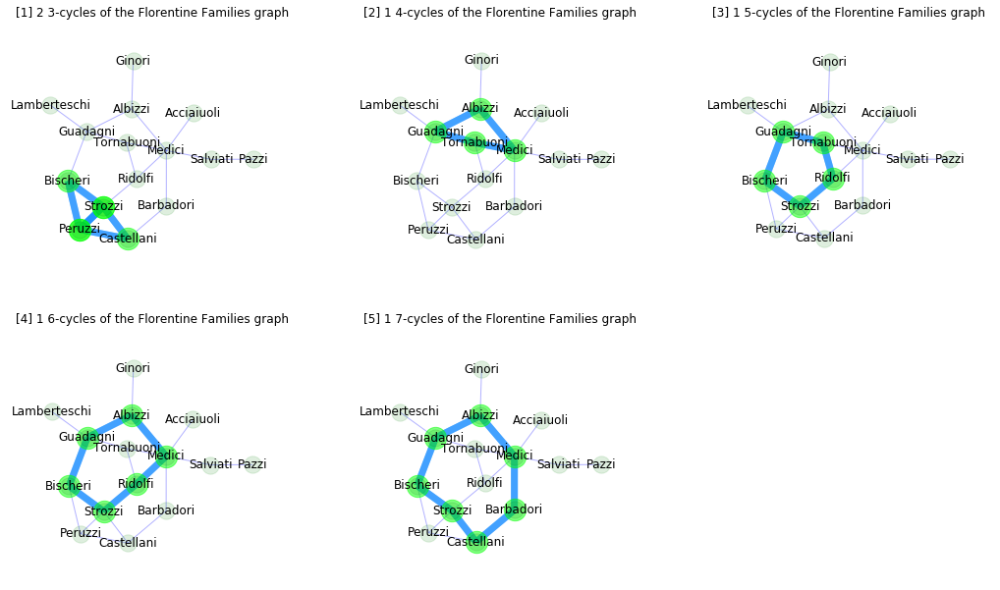

In [35]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

scycles=list(nx.cycle_basis(G))
print("The %s contains:")
cy_d={}
for k in range(len(G)):
    cy=[ z for z in scycles if len(z)==k ]
    if len(cy)>0:
        cy_d[k]=cy
        print("%i %i-cycles:\n%s" %(len(cy),k,cy))
nc=len(cy_d.values())

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,0.7*len(G)), sharex=True)
for i,j in list(enumerate(cy_d.values())):
    plt.subplot(r,3,i+1);
    sj = [item for sublist in j for item in sublist]
    outn=[n for n in G.nodes() if n not in j]
    ine=cycles2edges(G,j)
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=sj,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] %i %i-cycles of the %s" %(i+1,len(j),len(j[0]),name)
    plt.title(st)
    plt.axis('off');
    plt.margins(x=0.2, y=0.2)
    ax[r-1,1].set_visible(False)
    ax[r-1,2].set_visible(False)

### The Karate Club Graph

The %s contains:
34 3-cycles:
[[28, 33, 31], [32, 33, 31], [8, 30, 33], [32, 30, 33], [23, 29, 33], [26, 29, 33], [32, 29, 33], [23, 27, 33], [32, 23, 33], [32, 22, 33], [32, 20, 33], [32, 18, 33], [32, 15, 33], [32, 14, 33], [24, 25, 31], [1, 21, 0], [1, 19, 0], [1, 17, 0], [1, 13, 0], [2, 13, 0], [3, 13, 0], [3, 12, 0], [4, 10, 0], [5, 10, 0], [2, 8, 0], [1, 7, 0], [2, 7, 0], [3, 7, 0], [4, 6, 0], [5, 6, 0], [5, 16, 6], [1, 3, 0], [2, 3, 0], [1, 2, 0]]
8 4-cycles:
[[8, 33, 31, 0], [13, 33, 31, 0], [19, 33, 31, 0], [24, 27, 33, 31], [25, 23, 33, 31], [2, 32, 31, 0], [8, 32, 31, 0], [2, 28, 31, 0]]
3 5-cycles:
[[1, 30, 33, 31, 0], [2, 27, 33, 31, 0], [2, 9, 33, 31, 0]]


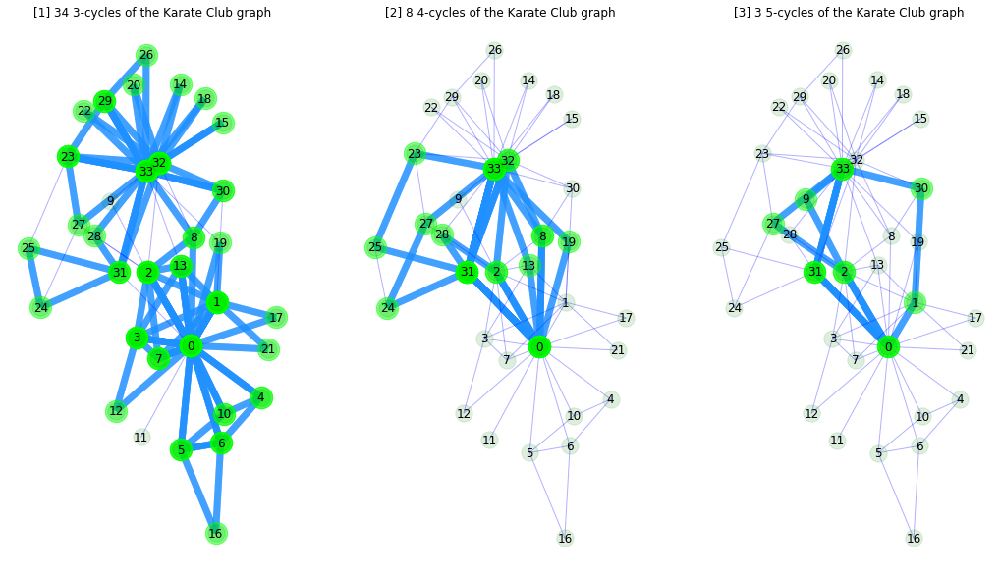

In [36]:
G=nx.karate_club_graph()
name = "Karate Club graph"

scycles=list(nx.cycle_basis(G))
print("The %s contains:")
cy_d={}
for k in range(len(G)):
    cy=[ z for z in scycles if len(z)==k ]
    if len(cy)>0:
        cy_d[k]=cy
        print("%i %i-cycles:\n%s" %(len(cy),k,cy))
nc=len(cy_d.values())

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,0.3*len(G)), sharex=True)
for i,j in list(enumerate(cy_d.values())):
    plt.subplot(r,3,i+1);
    sj = [item for sublist in j for item in sublist]
    outn=[n for n in G.nodes() if n not in j]
    ine=cycles2edges(G,j)
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=sj,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] %i %i-cycles of the %s" %(i+1,len(j),len(j[0]),name)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)
# ax[r-1,2].set_visible(False)

### Cycles in a Directed Erdos-Renyi Random Graph

In [37]:
while True:
    n=random.randint(15,26)
    p=random.uniform(0.1,0.2)
    G = nx.erdos_renyi_graph(n,p,directed=True)
    if nx.is_weakly_connected(G)==True:
        break
name = "directed Erdos-Renyi random graph"

uG=nx.Graph(G)
scycles=list(nx.cycle_basis(uG))
print("The %s contains:")
cy_d={}
for k in range(len(G)):
    cy=[ z for z in scycles if len(z)==k ]
    if len(cy)>0:
        cy_d[k]=cy
        print("%i %i-cycles:\n%s" %(len(cy),k,cy))
nc=len(cy_d.values())

The %s contains:
13 3-cycles:
[[4, 13, 1], [3, 12, 13], [4, 12, 13], [10, 12, 13], [2, 14, 12], [9, 14, 12], [4, 14, 12], [4, 15, 14], [4, 8, 15], [2, 6, 14], [3, 2, 12], [10, 2, 12], [9, 10, 0]]
5 4-cycles:
[[5, 13, 1, 0], [10, 13, 1, 0], [7, 13, 1, 0], [3, 6, 14, 12], [5, 2, 12, 13]]
4 5-cycles:
[[9, 12, 13, 1, 0], [7, 15, 14, 12, 13], [10, 8, 15, 14, 12], [5, 6, 14, 12, 13]]


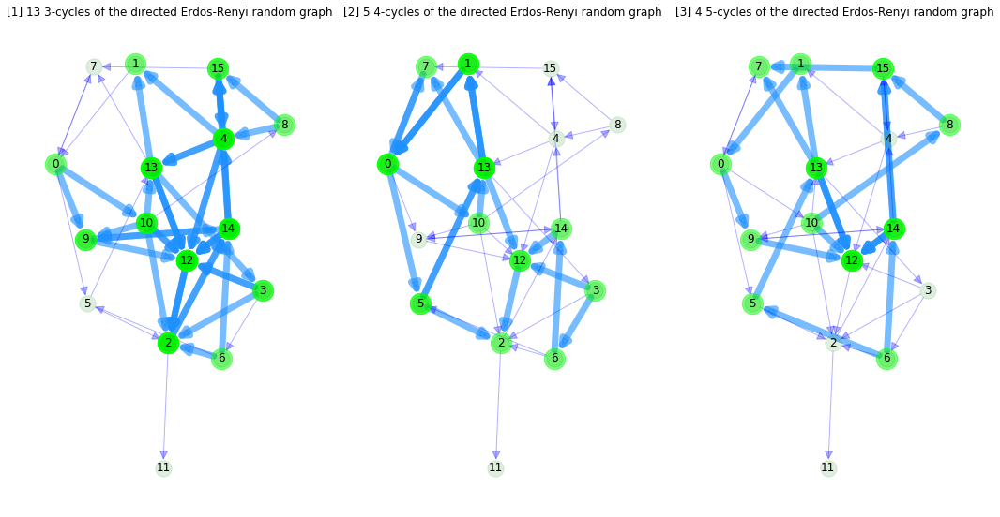

In [39]:
if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,0.6*len(G)), sharex=True)
for i,j in list(enumerate(cy_d.values())):
    plt.subplot(r,3,i+1);
    sj = [item for sublist in j for item in sublist]
    outn=[n for n in G.nodes() if n not in j]
    ine=cycles2edges(G,j)
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=sj,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos,arrowsize=20, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos,arrowsize=20, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] %i %i-cycles of the %s" %(i+1,len(j),len(j[0]),name)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)
#     ax[r-1,2].set_visible(False)

In [40]:
while True:
    n=random.randint(15,26)
    m=random.randint(30,41)
    G = nx.gnm_random_graph(n, m, directed=True)
    scycles=list(nx.simple_cycles(G))
    if nx.is_weakly_connected(G)==True and len(scycles)>2 and len(scycles)<8:
        break
name = "directed Gnm random graph"

scycles=list(nx.simple_cycles(G))
print("The %s contains:")
cy_d={}
for k in range(len(G)):
    cy=[ z for z in scycles if len(z)==k ]
    if len(cy)>0:
        cy_d[k]=cy
        print("%i %i-cycles:\n%s" %(len(cy),k,cy))

The %s contains:
2 2-cycles:
[[20, 12], [8, 18]]
2 4-cycles:
[[3, 5, 19, 18], [5, 19, 9, 20]]


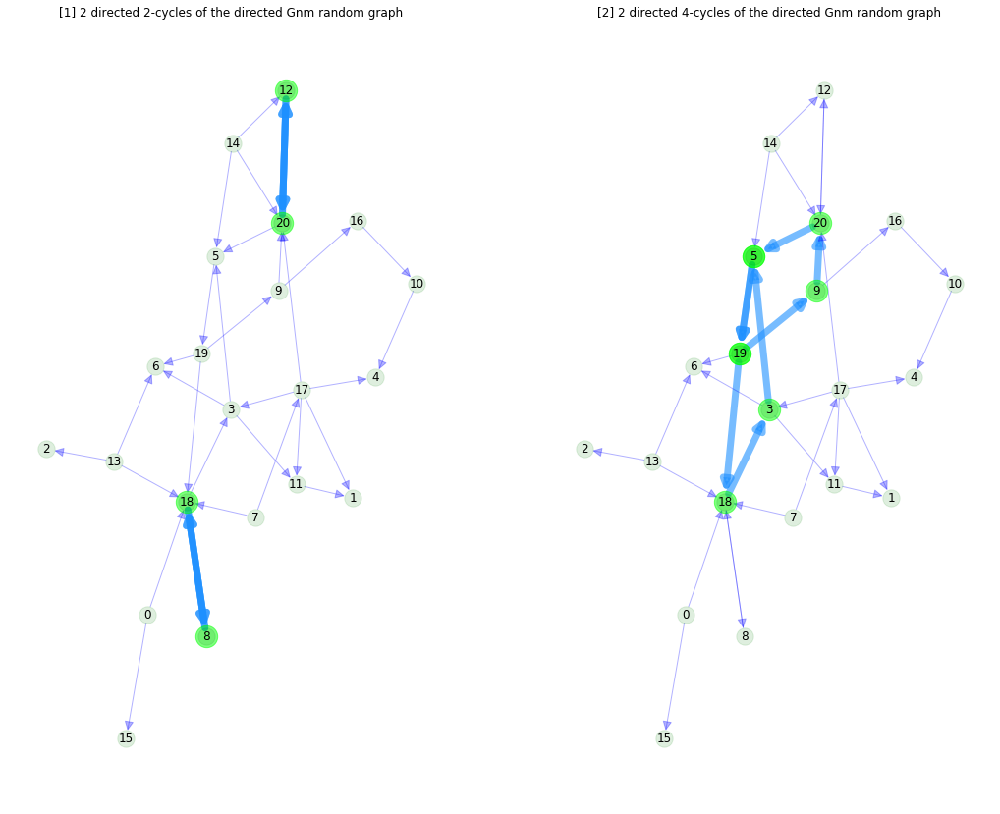

In [41]:
nc=len(cy_d.values())
if (nc/2.)%2==0:
    r=int(nc/2.)
else:
    r=int(math.ceil(nc/2.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,2,figsize=(18,0.7*len(G)), sharex=True)
for i,j in list(enumerate(cy_d.values())):
    plt.subplot(r,2,i+1);
    sj = [item for sublist in j for item in sublist]
    outn=[n for n in G.nodes() if n not in j]
    ine=cycles2edges(G,j)
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=sj,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos,arrowsize=20, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos,arrowsize=20, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] %i directed %i-cycles of the %s" %(i+1,len(j),len(j[0]),name)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
# ax[r-1,1].set_visible(False)
# ax[r-1,2].set_visible(False)

<a id='5'></a>
## <span style="color:green">5. Ego-nets</span>

### The Florentine Families Graph

11 nontrivial ego-nets of the Florentine Families graph


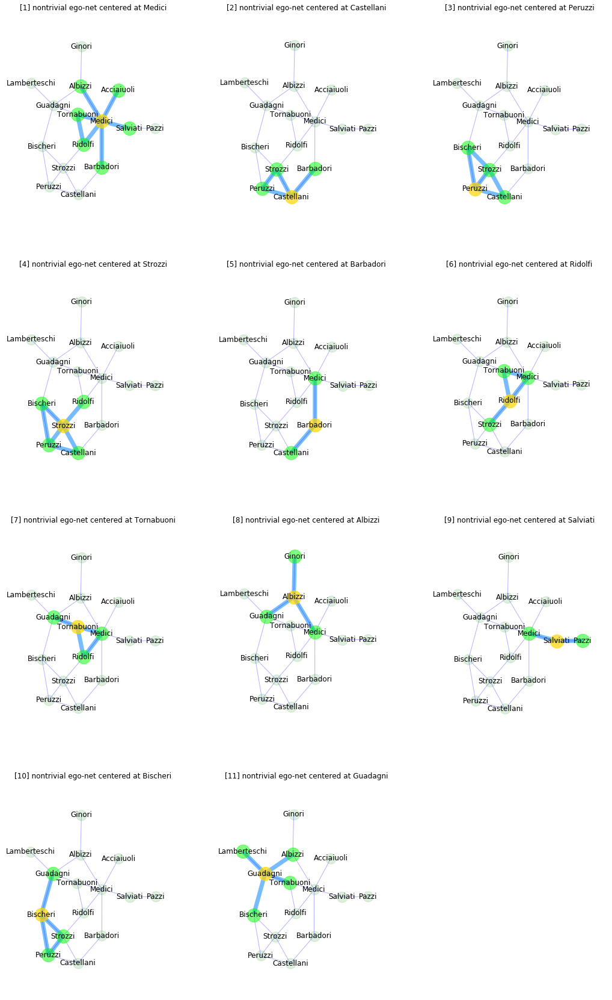

In [42]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

en_d={}
for n in G.nodes():
    eng=nx.ego_graph(G, n, undirected=True)
    if len(eng.nodes())>2:
        en_d[n]=(n,eng)
print("%i nontrivial ego-nets of the %s" %(len(en_d),name))
nc=len(en_d.values())

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(en_d.values())):
    plt.subplot(r,3,i+1);
    jj=j[1]
    ce=j[0]
    inn=list(jj.nodes())
    inna=[n for n in inn if n!=ce]
    outn=[n for n in G.nodes() if n not in inn]
    ine=list(jj.edges())
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[ce],node_size=500,node_color="gold", alpha=0.7)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=inna,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] nontrivial ego-net centered at %s" %(i+1,ce)
    plt.title(st)
    plt.axis('off');
    plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)
    ax[r-1,2].set_visible(False)

### The Karate Club Graph

33 nontrivial ego-nets of the Karate Club graph


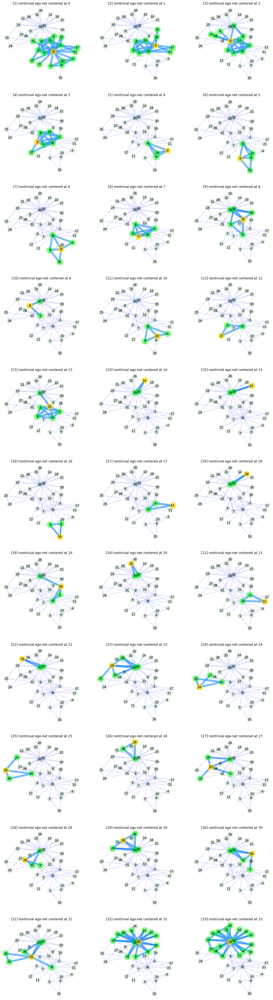

In [43]:
G=nx.karate_club_graph()
name = "Karate Club graph"

en_d={}
for n in G.nodes():
    eng=nx.ego_graph(G, n, undirected=True)
    if len(eng.nodes())>2:
        en_d[n]=(n,eng)
print("%i nontrivial ego-nets of the %s" %(len(en_d),name))
nc=len(en_d.values())

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(en_d.values())):
    plt.subplot(r,3,i+1);
    jj=j[1]
    ce=j[0]
    inn=list(jj.nodes())
    inna=[n for n in inn if n!=ce]
    outn=[n for n in G.nodes() if n not in inn]
    ine=list(jj.edges())
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[ce],node_size=500,node_color="gold", alpha=0.7)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=inna,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] nontrivial ego-net centered at %s" %(i+1,ce)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)
#     ax[r-1,2].set_visible(False)

### Ego-nets in a Directed Erdos-Renyi Random Graph

In [48]:
while True:
    n=random.randint(10,21)
    p=random.uniform(0.1,0.2)
    G = nx.erdos_renyi_graph(n,p,directed=True)
    if nx.is_weakly_connected(G)==True:
        break
name = "directed Erdos-Renyi random graph"

17 nontrivial ego-nets of the directed Erdos-Renyi random graph


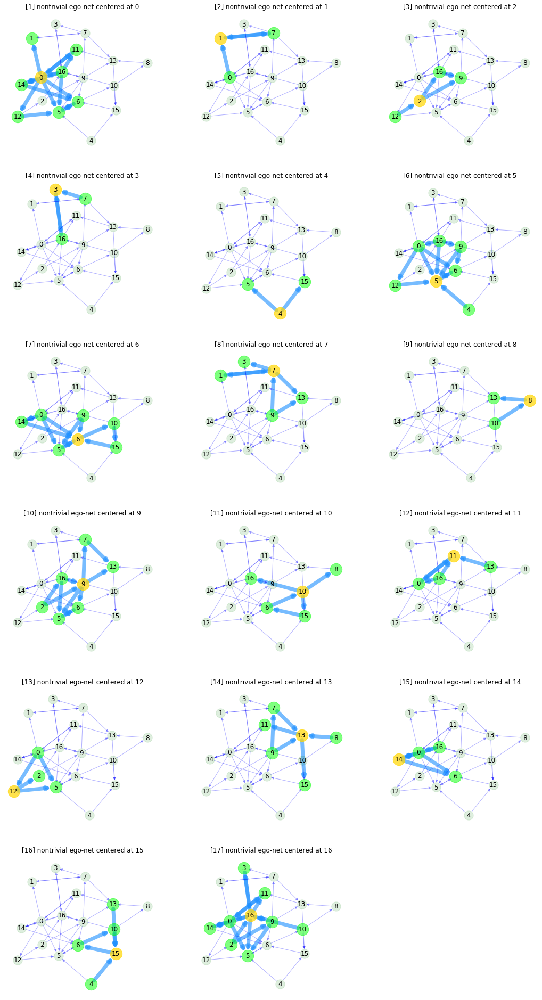

In [50]:
en_d={}
for n in G.nodes():
    eng=nx.ego_graph(G, n, undirected=True)
    if len(eng.nodes())>2:
        en_d[n]=(n,eng)
print("%i nontrivial ego-nets of the %s" %(len(en_d),name))
nc=len(en_d.values())

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(en_d.values())):
    plt.subplot(r,3,i+1);
    jj=j[1]
    ce=j[0]
    inn=list(jj.nodes())
    inna=[n for n in inn if n!=ce]
    outn=[n for n in G.nodes() if n not in inn]
    ine=list(jj.edges())
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[ce],node_size=500,node_color="gold", alpha=0.7)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=inna,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] nontrivial ego-net centered at %s" %(i+1,ce)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
#     ax[r-1,1].set_visible(False)
    ax[r-1,2].set_visible(False)

### Ego-nets in a Directed Gnm Random Graph

In [46]:
while True:
    n=random.randint(15,26)
    m=random.randint(30,41)
    G = nx.gnm_random_graph(n, m, directed=True)
    if nx.is_weakly_connected(G)==True:
        break
name = "directed Gnm random graph"

15 nontrivial ego-nets of the directed Gnm random graph


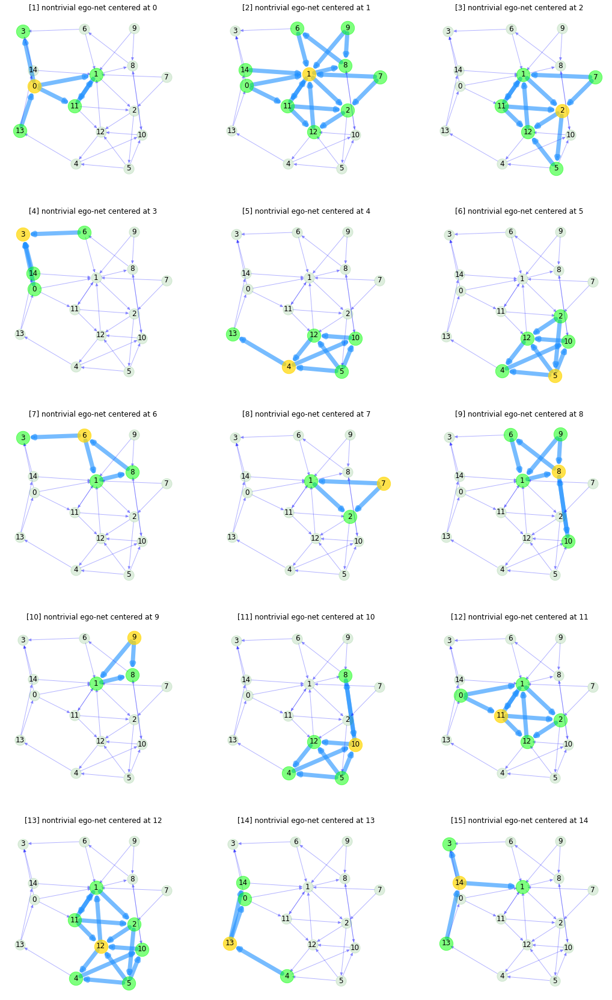

In [47]:
en_d={}
for n in G.nodes():
    eng=nx.ego_graph(G, n, undirected=True)
    if len(eng.nodes())>2:
        en_d[n]=(n,eng)
print("%i nontrivial ego-nets of the %s" %(len(en_d),name))
nc=len(en_d.values())

if (nc/3.)%3==0:
    r=int(nc/3.)
else:
    r=int(math.ceil(nc/3.))
pos=graphviz_layout(G)
fig, ax = plt.subplots(r,3,figsize=(18,2*len(G)), sharex=True)
for i,j in list(enumerate(en_d.values())):
    plt.subplot(r,3,i+1);
    jj=j[1]
    ce=j[0]
    inn=list(jj.nodes())
    inna=[n for n in inn if n!=ce]
    outn=[n for n in G.nodes() if n not in inn]
    ine=list(jj.edges())
    oute=[e for e in G.edges() if e not in ine]
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=[ce],node_size=500,node_color="gold", alpha=0.7)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=inna,node_size=500,node_color="lime", alpha=0.5)
    nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
    nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
    nx.draw_networkx_labels(G, pos)
    st="[%i] nontrivial ego-net centered at %s" %(i+1,ce)
    plt.title(st)
    plt.axis('off');
#     plt.margins(x=0.2, y=0.2)
    ax[r-1,1].set_visible(False)
    ax[r-1,2].set_visible(False)